In [5]:
from sklearn.mixture import GaussianMixture
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import umap

In [32]:
df = pd.read_csv('../data/normalized-perchip-arcsinh.csv')

# Sort by variances
I'm thinking this will increase separability

In [69]:
def n_features(n, ax):
    arr = df.values[:, 1:].astype(np.float64)
    vars = np.var(arr, axis=0)
    idxs = np.argsort(-vars)[:n]

    arr = arr[:, idxs]

    gm = GaussianMixture(n_components=5, reg_covar=0.0001)
    gm.fit(arr)
    ax.plot(gm.predict(arr), '.-')
    ax.set(title=f"GMM assignments for time steps, k=5", xlabel="Time step", ylabel="Cluster assignment")

    # Explicit y-axis tick marks (0 through 4 for 5 clusters)
    ax.set_yticks([0, 1, 2, 3, 4])

    # Light gray horizontal grid lines
    ax.yaxis.grid(True, color='lightgray', linestyle='-', linewidth=0.8)
    ax.set_axisbelow(True)  # Push grid lines behind the plot data

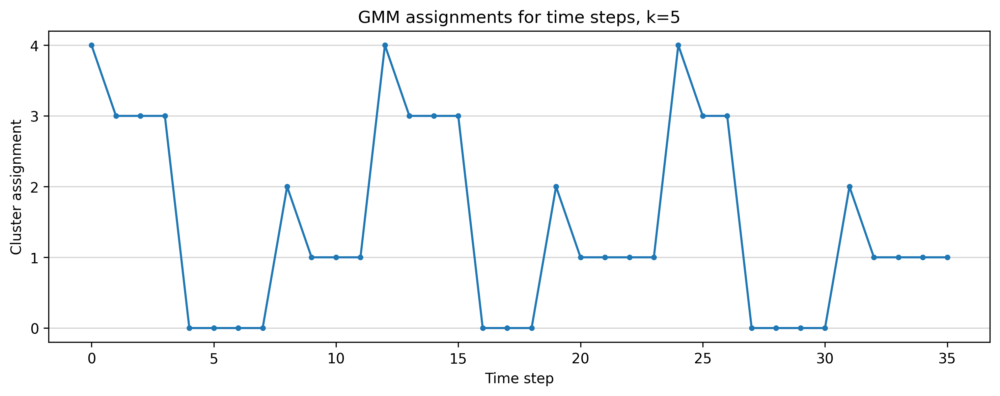

In [74]:
fig, ax = plt.subplots(figsize=(12, 4), dpi=300)

n_features(200, ax)

plt.show()


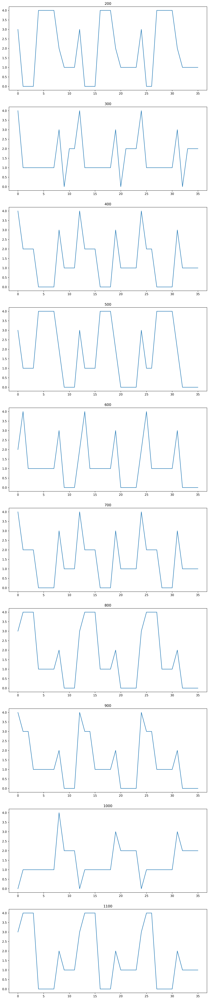

In [34]:
fig, axes = plt.subplots(10, 1, figsize=(12, 60), dpi=300)

for i in range(10):
    ax = axes[i]
    n_features(i * 100 + 200, ax)

plt.show()

    

In [ ]:
def n_features(n):
    arr = df.values[:, 1:].astype(np.float32)
    vars = np.var(arr, axis=0)
    idxs = np.argsort(-vars)[:n]

    arr = arr[:, idxs]

    gm = GaussianMixture(n_components=5)
    gm.fit(arr)

    print(gm.predict_proba(arr))

In [75]:
def n_features(n):
    arr = df.values[:, 1:].astype(np.float64)
    vars = np.var(arr, axis=0)
    idxs = np.argsort(-vars)[:n]

    arr = arr[:, idxs]

    gm = GaussianMixture(n_components=5, reg_covar=0.0001)
    gm.fit(arr)
    return gm.predict(arr)

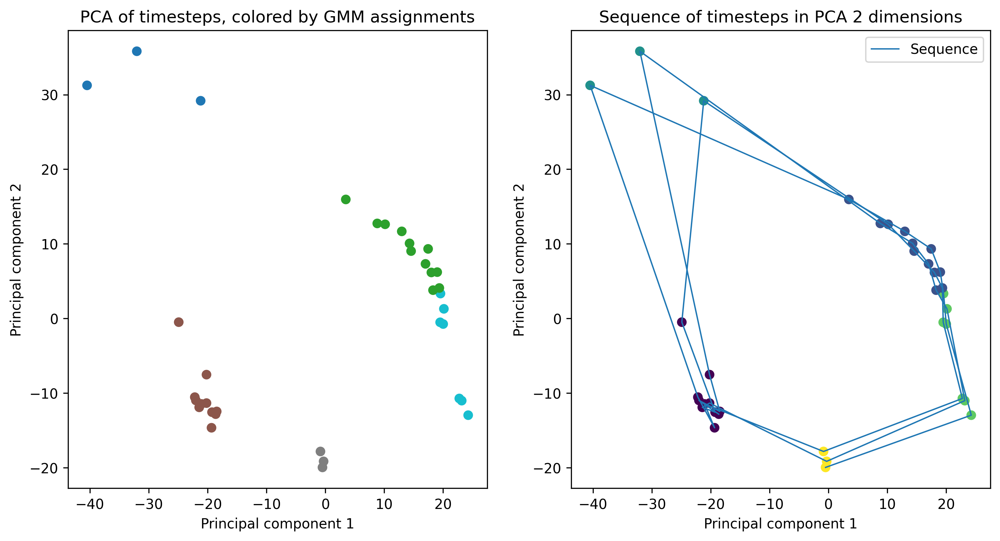

In [ ]:
pca = PCA(n_components = 2)

x = pca.fit_transform(df.values[:, 1:])


fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6), dpi=300)

ax1.scatter(x[:, 0], x[:, 1], cmap='tab10', c=n_features(200))

ax2.scatter(x[:, 0], x[:, 1], cmap='viridis', c=np.linspace(0, 1, 36))
ax2.plot(x[:, 0], x[:, 1])

plt.show()

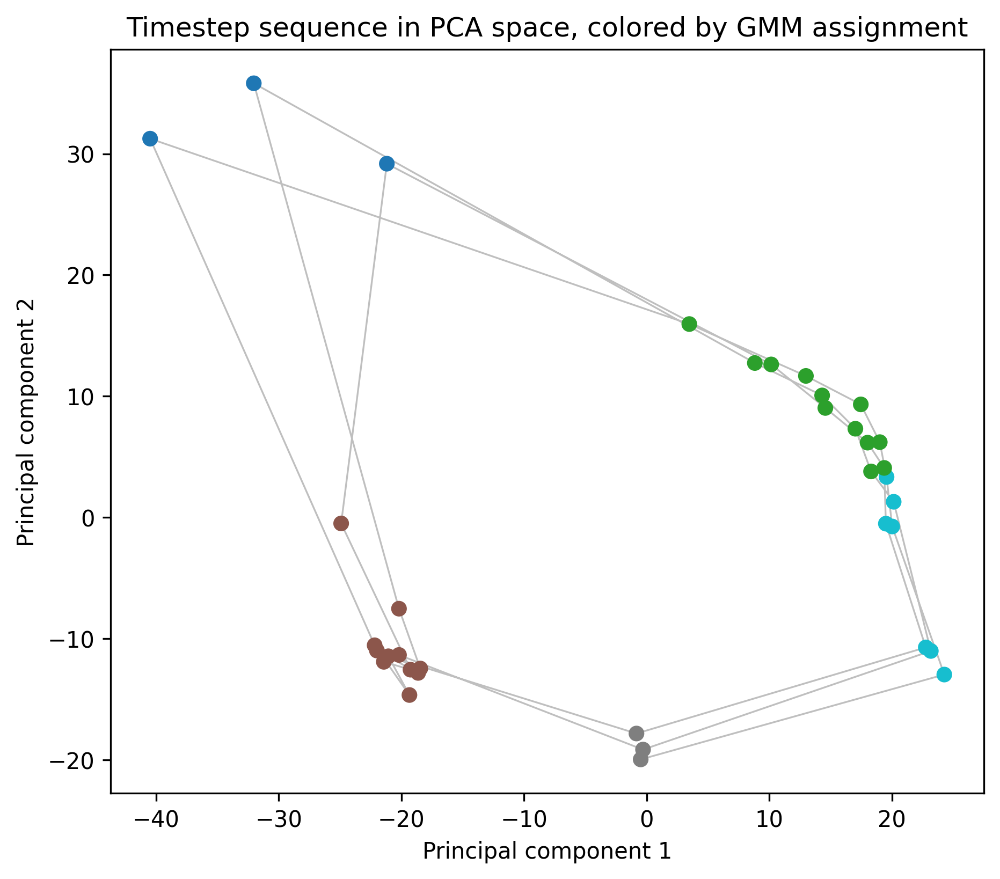

In [103]:
pca = PCA(n_components=2)
x = pca.fit_transform(df.values[:, 1:])
labels = n_features(200)

fig, ax = plt.subplots(figsize=(7, 6), dpi=300)

# Line first so dots render on top
ax.plot(x[:, 0], x[:, 1], color='gray', linewidth=0.8, alpha=0.5, zorder=1)
ax.scatter(x[:, 0], x[:, 1], c=labels, cmap='tab10', zorder=2)

# for i, label in zip([0, 35], ["t=1", "t=36"]):
#     ax.annotate(
#         label,
#         xy=(x[i, 0], x[i, 1]),
#         xytext=(8, 0),
#         textcoords="offset points",
#         fontsize=8,
#         color="black",
#     )


ax.set(
    title="Timestep sequence in PCA space, colored by GMM assignment",
    xlabel="Principal component 1",
    ylabel="Principal component 2",
)
plt.show()


In [ ]:
pca = PCA(n_components = 2)

x = pca.fit_transform(df.values[:, 1:])


fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6), dpi=300)

ax1.scatter(x[:, 0], x[:, 1], cmap='tab10', c=n_features(200))
ax1.set(title="PCA of timesteps, colored by GMM assignments", xlabel="Principal component 1", ylabel="Principal component 2")

ax2.scatter(x[:, 0], x[:, 1], cmap='viridis', c=n_features(200))
ax2.plot(x[:, 0], x[:, 1], linewidth=1, label="Sequence")
ax2.legend()

ax2.set(title="Sequence of timesteps in PCA 2 dimensions", xlabel="Principal component 1", ylabel="Principal component 2")

plt.show()

# Fit on dimension-reduced data
n << d which is leading to super confident assignments. I'm going to fit on way dimension reduced data instead

In [13]:
df = pd.read_csv('../data/normalized-perchip-arcsinh.csv')
X = df.values[:, 1:].astype(np.float64)

In [14]:
pca = PCA(5)

X5 = pca.fit_transform(X)
train, test = X5[:24], X5[24:]

gmm = GaussianMixture(4)
gmm.fit(train)

gmm.predict(test)

array([1, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1])

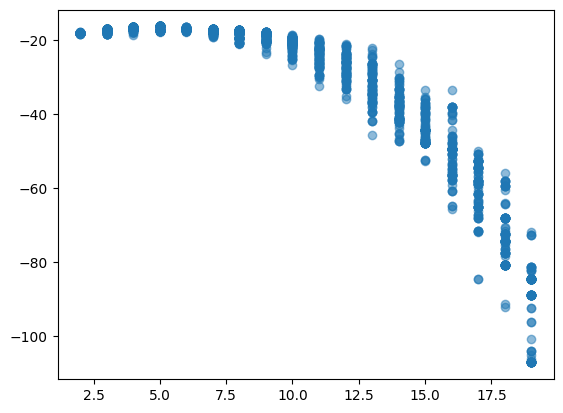

In [ ]:
pca = PCA(5)

X5 = pca.fit_transform(X)
train, test = X5[:24], X5[24:]

scores = []
for n in range(2, 20):
    for i in range(100):
        gmm = GaussianMixture(n, covariance_type='tied', reg_covar=0.1)
        gmm.fit(train)

        scores.append(np.array([n, gmm.score(test)]))

scores = np.array(scores)

plt.scatter(scores.T[0], scores.T[1], alpha=.5)
plt.show()

In [31]:
for i in range(2, 20):
    mask = scores.T[0] == i
    print(i, np.mean(scores[mask, 1]))

2 -18.218434518360546
3 -17.40596655109083
4 -16.92730369999687
5 -16.89196733527114
6 -17.183909870077624
7 -17.694628979708188
8 -18.55317481658952
9 -19.24662423409477
10 -21.200774660180453
11 -24.33871705541727
12 -27.153745717350446
13 -32.22679235424551
14 -38.13339588694592
15 -43.829950955371906
16 -50.506385254457385
17 -59.98560401192336
18 -72.77264171269607
19 -90.60275505721211


# What the heck, gmm on the genes

In [ ]:
df = pd.read_csv('src/data/normalized-perchip-arcsinh.csv')
X = df.values[:, 1:].astype(np.float64).T
X.shape

(9275, 36)

## Unreduced gene data

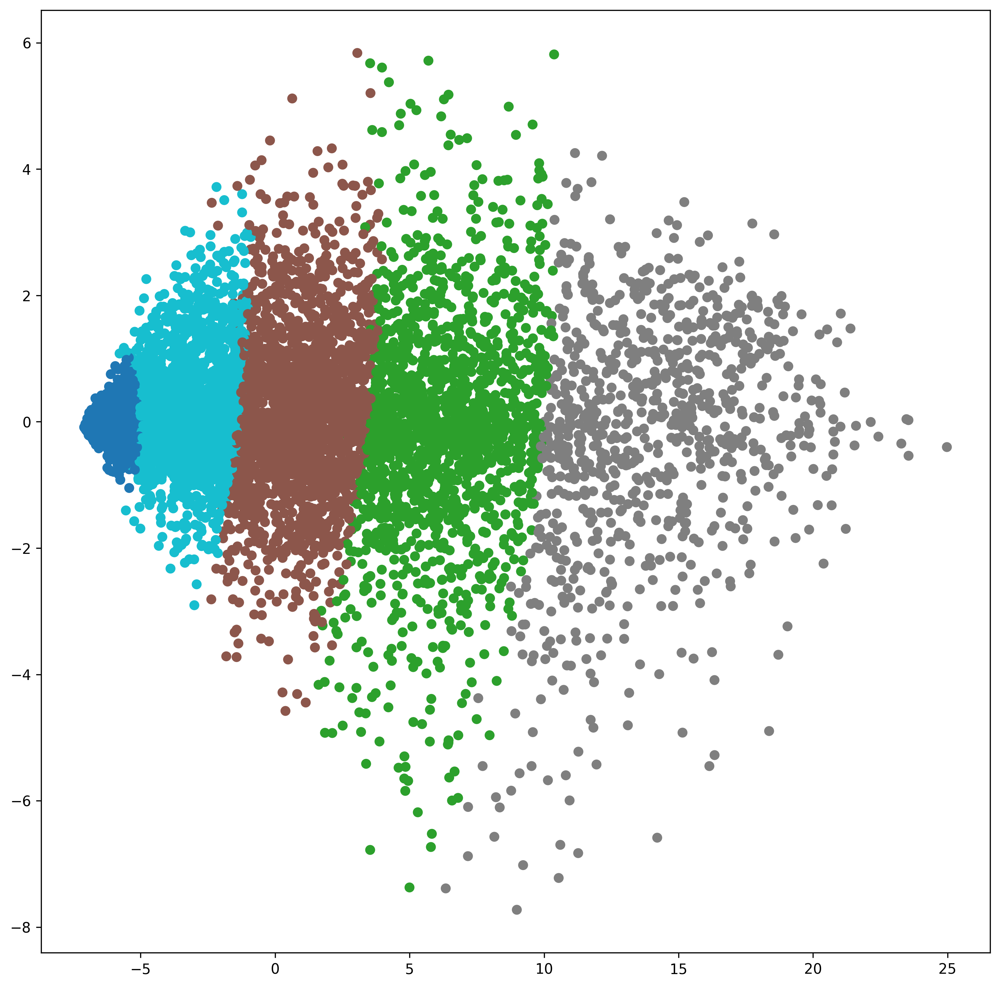

In [ ]:
gmm = GaussianMixture(5, covariance_type='diag', reg_covar=0.01)
pca = PCA(2)

gmm.fit(X)

X2 = pca.fit_transform(X)

fig, ax = plt.subplots(figsize=(12, 12), dpi=300)
ax.scatter(X2.T[0], X2.T[1], cmap='tab10', c=gmm.predict(X))

plt.show()

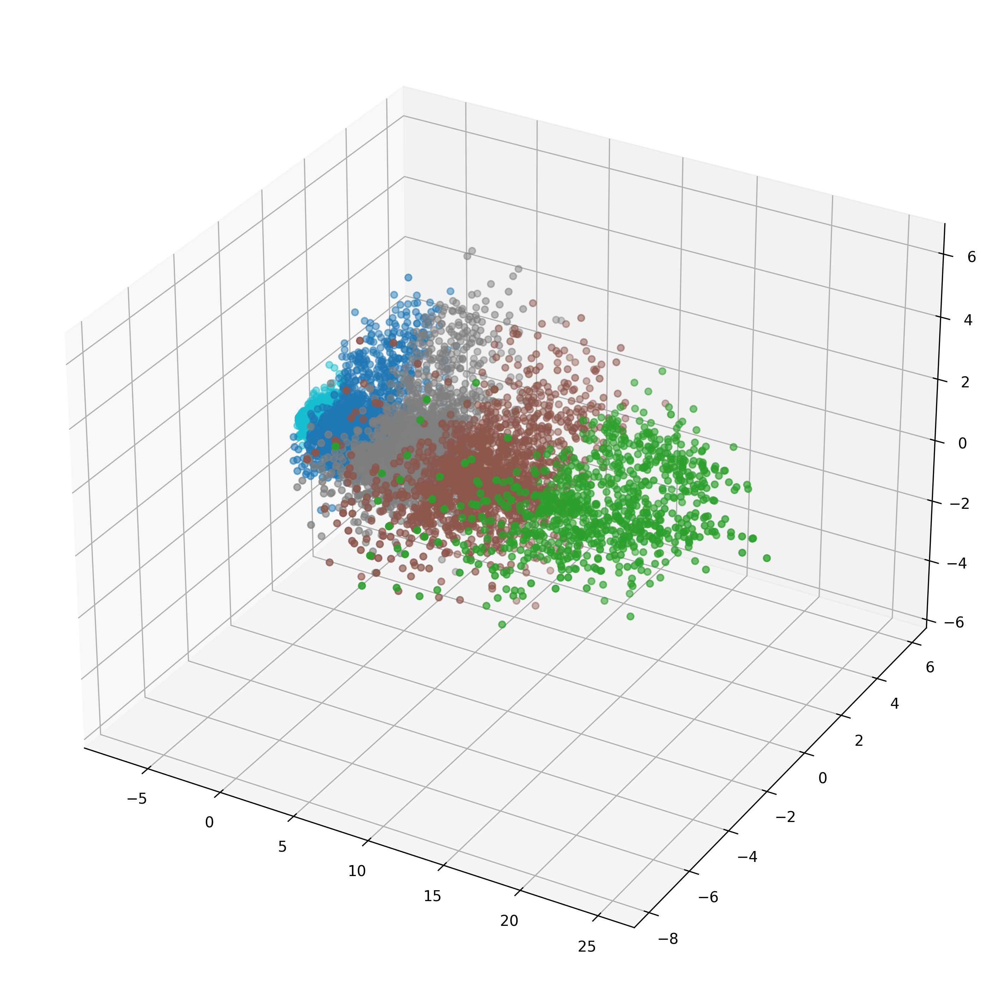

In [ ]:
gmm = GaussianMixture(5, covariance_type='diag', reg_covar=0.01)
pca = PCA(3)

gmm.fit(X)

X2 = pca.fit_transform(X)

fig, ax = plt.subplots(figsize=(12, 12), dpi=300, subplot_kw={'projection':'3d'})
ax.scatter(X2.T[0], X2.T[1], X2.T[2], cmap='tab10', c=gmm.predict(X))

plt.show()

## PCA Reduced Gene data

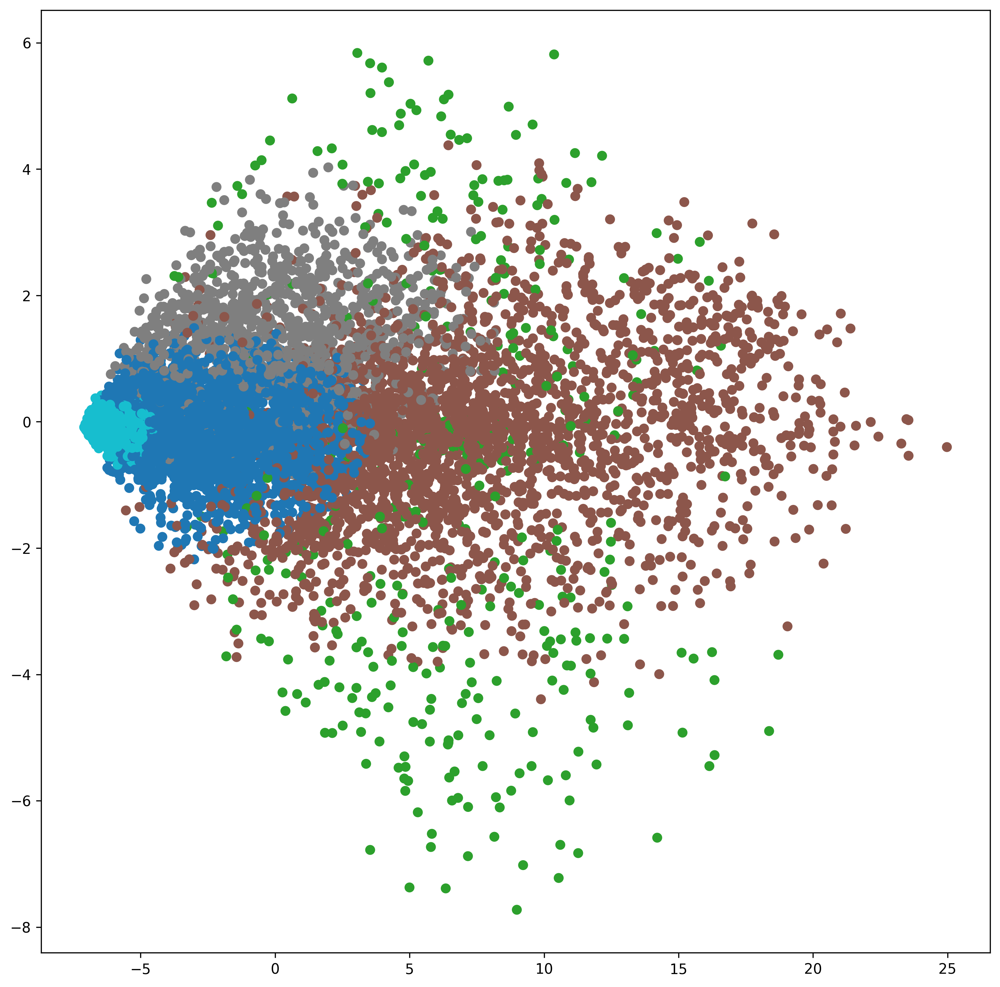

In [ ]:
gmm = GaussianMixture(5, covariance_type='diag', reg_covar=0.01)
pca2 = PCA(2)
pca5 = PCA(5)
X5 = pca5.fit_transform(X)

gmm.fit(X5)

X2 = pca.fit_transform(X)

fig, ax = plt.subplots(figsize=(12, 12), dpi=300)
ax.scatter(X2.T[0], X2.T[1], cmap='tab10', c=gmm.predict(X5))

plt.show()

## UMAP Reduced Gene Data

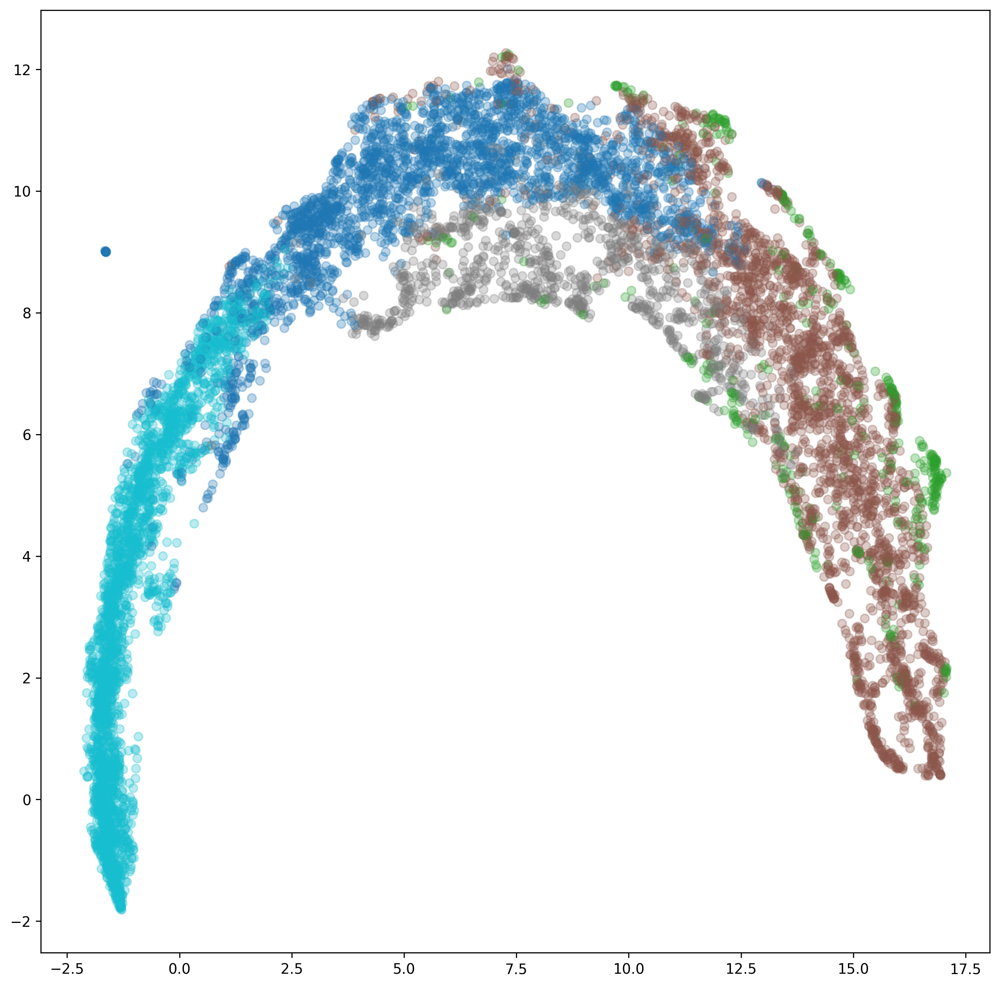

In [ ]:
um = umap.UMAP(n_components=2)
umX2 = um.fit_transform(X)

fig, ax = plt.subplots(figsize=(12, 12), dpi=300)
ax.scatter(umX2.T[0], umX2.T[1], cmap='tab10', c=gmm.predict(X5), alpha=.3)

plt.show()